In [1]:
import pandas as pd
import tensorflow as tf
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from keras.preprocessing.text import Tokenizer
import re
from nltk.sentiment.util import *
nltk.download('stopwords')
from nltk.stem import PorterStemmer
import numpy as np
import string
from  nltk.stem import SnowballStemmer
nltk.download('words')
nltk.download('punkt')
from keras.utils import pad_sequences
from keras.utils import to_categorical
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from keras import layers
from keras import optimizers
import torch
import matplotlib.pyplot as plt
from keras import Sequential
from torch.utils.data import TensorDataset, random_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import math
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore",category=UserWarning)
sns.set_style("whitegrid")
%matplotlib inline
np.random.seed(7)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\engba\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\engba\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\engba\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
path_way = "/train.csv"
df = pd.read_csv(path_way)

In [3]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [4]:
score_distribution = df['Score'].value_counts()
print(score_distribution)

Score
5    363122
4     80655
1     52268
3     42640
2     29769
Name: count, dtype: int64


In [5]:
df.drop(['Id','ProductId', 'UserId', 'ProfileName',	'HelpfulnessNumerator',	'HelpfulnessDenominator','Time', 'Summary'	], inplace = True,axis = 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   Score   568454 non-null  int64 
 1   Text    568454 non-null  object
dtypes: int64(1), object(1)
memory usage: 8.7+ MB


In [6]:
np.sum(df.isnull().any(axis=1))

0

In [7]:
print(df.isnull().any(axis=1))

0         False
1         False
2         False
3         False
4         False
          ...  
568449    False
568450    False
568451    False
568452    False
568453    False
Length: 568454, dtype: bool


In [8]:
df.isna().any()

Score    False
Text     False
dtype: bool

In [9]:
df['Text'] = df['Text'].str.lower()
df[['Text']].tail()

,Text
568449,great for sesame chicken..this is a good if no...
568450,i'm disappointed with the flavor. the chocolat...
568451,"these stars are small, so you can give 10-15 o..."
568452,these are the best treats for training and rew...
568453,"i am very satisfied ,product is as advertised,..."


In [10]:
Score = np.array(df['Score'])
rev_class = np.empty_like(Score)
for i  in range(len(rev_class)):
  if Score[i] >= 4:
    rev_class[i] = 2  # class1 : Pos Class
  elif Score[i] <= 2:
    rev_class[i] = 0  # class2 : Neg class
  elif Score[i] == 3:
    rev_class[i] = 1  # class3 : Neutral class

df['Score'] = rev_class

In [11]:
stop_words = stopwords.words("english")
stemmer = SnowballStemmer("english")
TAG_RE = re.compile(r'<[^>]+>')
TEXT_CLEANING_RE = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"

In [20]:
def preprocess(text, stem=False):
    text = TAG_RE.sub('', text)
    text = re.sub(TEXT_CLEANING_RE, ' ', str(text).lower()).strip()
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    tokens = []
    for token in text.split():
        if token not in stop_words:
            if stem:
                tokens.append(stemmer.stem(token))
            else:
                tokens.append(token)
    return " ".join(tokens)

In [ ]:
X_h = [tokenizer.encode(text, add_special_tokens=True) for text in headline]


In [37]:
if torch.cuda.is_available():

    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

No GPU available, using the CPU instead.


In [39]:
if torch.cuda.is_available():

    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)
for sentence in df['Text'][:10000]:
  print(sentence)

No GPU available, using the CPU instead.
i have bought several of the vitality canned dog food products and have found them all to be of good quality. the product looks more like a stew than a processed meat and it smells better. my labrador is finicky and she appreciates this product better than  most.
product arrived labeled as jumbo salted peanuts...the peanuts were actually small sized unsalted. not sure if this was an error or if the vendor intended to represent the product as "jumbo".
this is a confection that has been around a few centuries.  it is a light, pillowy citrus gelatin with nuts - in this case filberts. and it is cut into tiny squares and then liberally coated with powdered sugar.  and it is a tiny mouthful of heaven.  not too chewy, and very flavorful.  i highly recommend this yummy treat.  if you are familiar with the story of c.s. lewis' "the lion, the witch, and the wardrobe" - this is the treat that seduces edmund into selling out his brother and sisters to the w

In [59]:
#LSTM
df['Score'] = df['Score'].map({0:'Negative', 1: 'Neutral', 2:'Positive'})
df

,Score,Text
0,Positive,i have bought several of the vitality canned d...
1,Negative,product arrived labeled as jumbo salted peanut...
2,Positive,this is a confection that has been around a fe...
3,Negative,if you are looking for the secret ingredient i...
4,Positive,great taffy at a great price. there was a wid...
...,...,...
568449,Positive,great for sesame chicken..this is a good if no...
568450,Negative,i'm disappointed with the flavor. the chocolat...
568451,Positive,"these stars are small, so you can give 10-15 o..."
568452,Positive,these are the best treats for training and rew...


<Axes: xlabel='Score'>

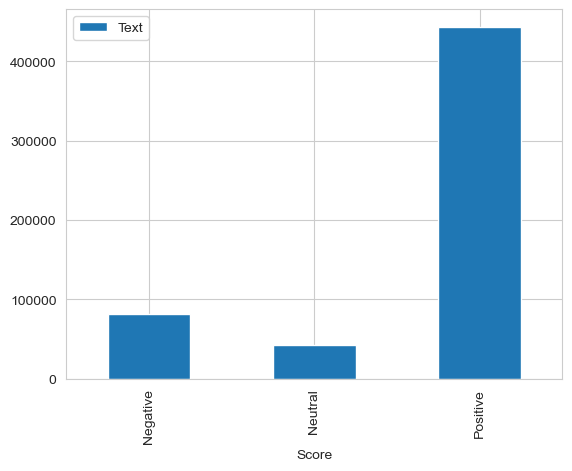

In [60]:
df.groupby('Score').count().plot(kind='bar')

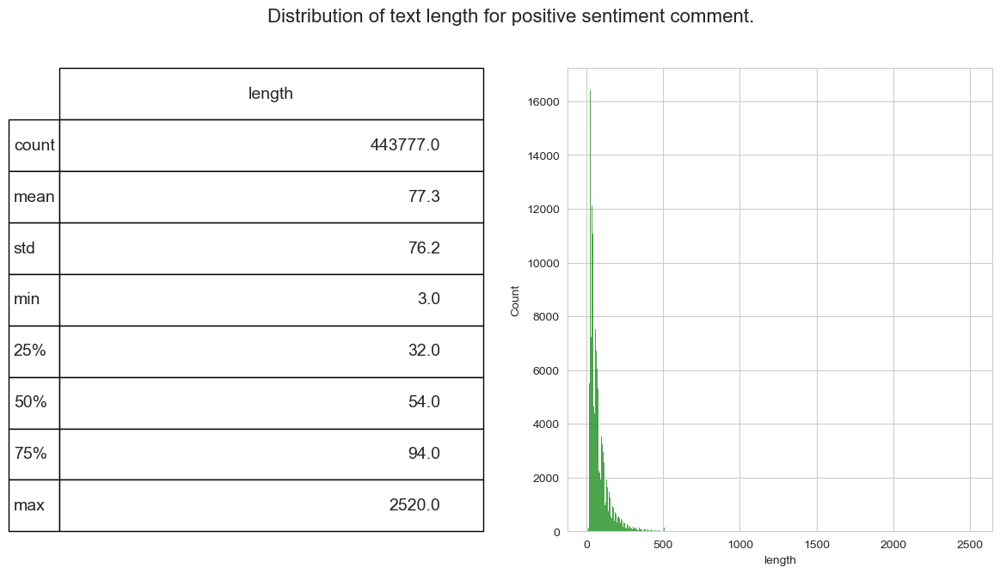

In [61]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.Text.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['Score']=='Positive']['length'], ax=ax1,color='green')
describe = df.length[df.Score=='Positive'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment comment.', fontsize=16)

plt.show()

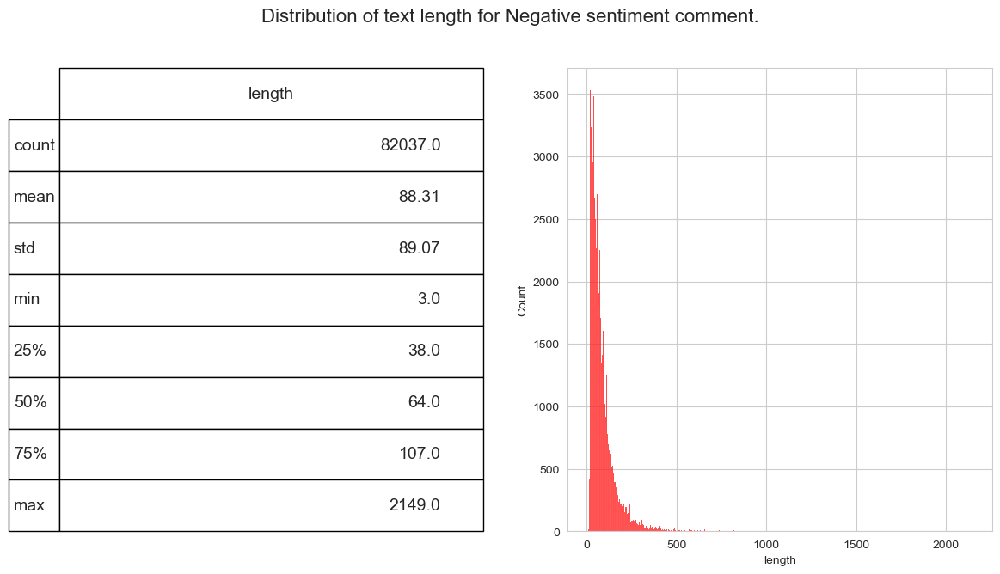

In [62]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.Text.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['Score']=='Negative']['length'], ax=ax1,color='red')
describe = df.length[df.Score=='Negative'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for Negative sentiment comment.', fontsize=16)

plt.show()

In [63]:
import plotly.express as px
fig = px.pie(df, names='Score', title ='Pie chart of different sentiments of comments')
fig.show()

In [64]:
df.drop(['length'], axis=1, inplace=True)
df.head

<bound method NDFrame.head of            Score                                               Text
0       Positive  i have bought several of the vitality canned d...
1       Negative  product arrived labeled as jumbo salted peanut...
2       Positive  this is a confection that has been around a fe...
3       Negative  if you are looking for the secret ingredient i...
4       Positive  great taffy at a great price.  there was a wid...
...          ...                                                ...
568449  Positive  great for sesame chicken..this is a good if no...
568450  Negative  i'm disappointed with the flavor. the chocolat...
568451  Positive  these stars are small, so you can give 10-15 o...
568452  Positive  these are the best treats for training and rew...
568453  Positive  i am very satisfied ,product is as advertised,...

[568454 rows x 2 columns]>

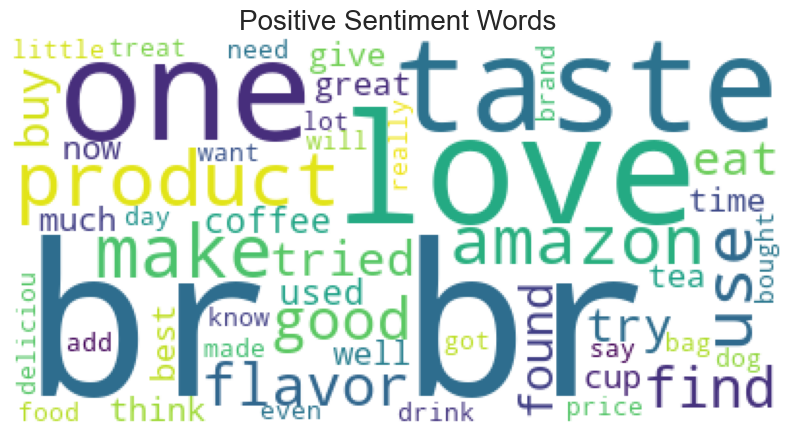

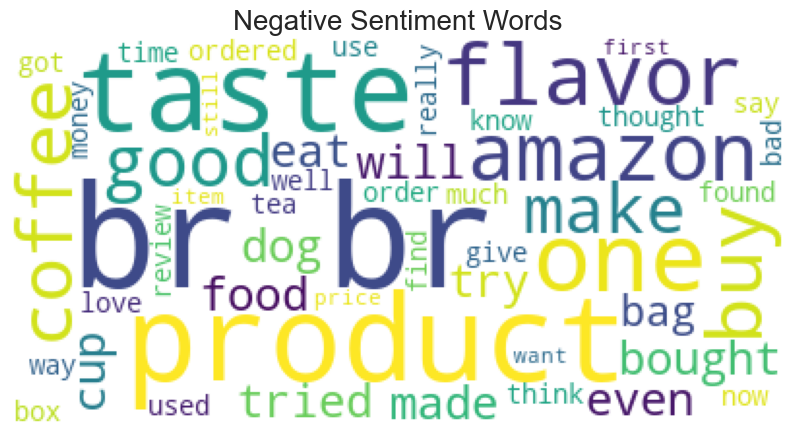

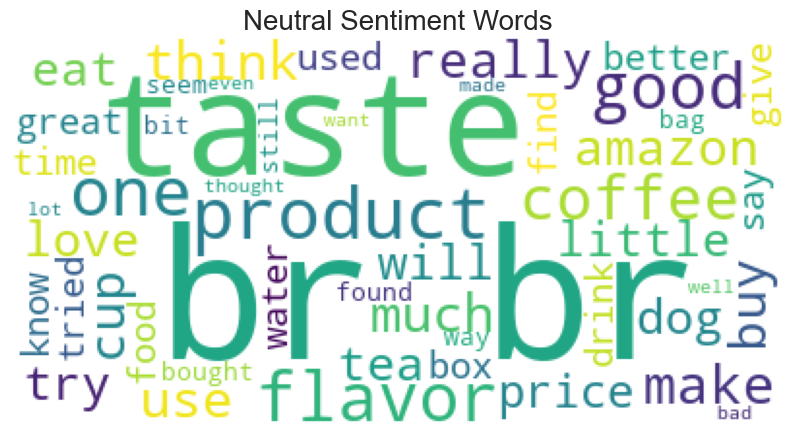

In [66]:
from wordcloud import WordCloud, STOPWORDS

def wordcount_gen(df, Score):
    
    combined_tweets = " ".join([tweet for tweet in df[df.Score==Score]['Text']])

    wc = WordCloud(background_color='white', 
                   max_words=50, 
                   stopwords = STOPWORDS)

    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('{} Sentiment Words'.format(Score), fontsize=20)
    plt.axis('off')
    plt.show()
    
wordcount_gen(df, 'Positive')
     
wordcount_gen(df, 'Negative')

wordcount_gen(df, 'Neutral')

In [71]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

selected_columns = ['Text', 'Score']
df_selected = df[selected_columns]

X = df_selected['Text']
Y = df_selected['Score']

le = LabelEncoder()
Y_encoded = le.fit_transform(Y)

print(X[0])
print(Y[0])


i have bought several of the vitality canned dog food products and have found them all to be of good quality. the product looks more like a stew than a processed meat and it smells better. my labrador is finicky and she appreciates this product better than  most.
Positive


In [72]:
y = pd.get_dummies(df['Score'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [73]:
from sklearn.feature_extraction.text import CountVectorizer

vocabulary_size = 5000

count_vector = CountVectorizer(max_features=vocabulary_size,
                                preprocessor=lambda x: x,
                               tokenizer=lambda x: x) 

X_train = count_vector.fit_transform(X_train).toarray()

X_test = count_vector.transform(X_test).toarray()

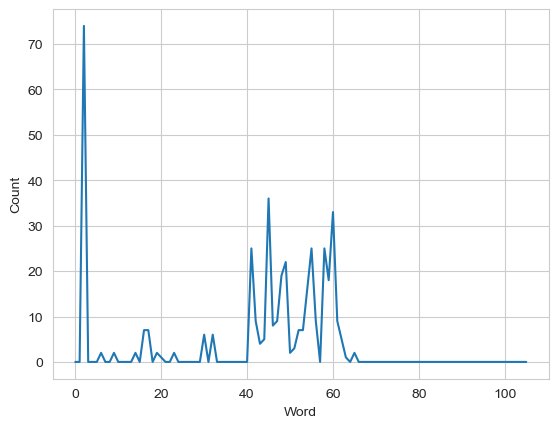

In [74]:
plt.plot(X_train[2,:])
plt.xlabel('Word')
plt.ylabel('Count')
plt.show()

In [75]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

max_words = 5000
max_len=100

def tokenize_pad_sequences(text):

    tokenizer = Tokenizer(num_words=max_words, lower=True, split=' ')
    tokenizer.fit_on_texts(text)
  
    X = tokenizer.texts_to_sequences(text)
  
    X = pad_sequences(X, padding='post', maxlen=max_len)
   
    return X, tokenizer

print('Before Tokenization & Padding \n', df['Text'][0])
X, tokenizer = tokenize_pad_sequences(df['Text'])
print('After Tokenization & Padding \n', X[0])

Before Tokenization & Padding 
 i have bought several of the vitality canned dog food products and have found them all to be of good quality. the product looks more like a stew than a processed meat and it smells better. my labrador is finicky and she appreciates this product better than  most.
After Tokenization & Padding 
 [   2   17  125  319    7    1 4940  523  103   52  204    3   17  117
   28   41    5   30    7   29  183    1   38  629   48   26    4 2636
   58    4 1183  448    3    6  619   99   13    8 1777    3   94    9
   38   99   58  140    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]


In [76]:
import pickle

with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

In [77]:
y = pd.get_dummies(df['Score'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (341072, 100) (341072, 3)
Validation Set -> (113691, 100) (113691, 3)
Test Set -> (113691, 100) (113691, 3)


In [78]:
import keras.backend as K

def f1_score(precision, recall):
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [79]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout

vocab_size = 5000
embedding_size = 32
max_len = 100  

model = Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=max_len))
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(32)))
model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax')) 

model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 32)           160000    
                                                                 
 conv1d (Conv1D)             (None, 100, 32)           3104      
                                                                 
 max_pooling1d (MaxPooling1  (None, 50, 32)            0         
 D)                                                              
                                                                 
 bidirectional (Bidirection  (None, 64)                16640     
 al)                                                             
                                                                 
 dropout_75 (Dropout)        (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 3)               

In [80]:
from keras.models import Sequential
from keras.layers import Embedding, Bidirectional, LSTM, Dense, Dropout
from keras.optimizers import Adam

max_len = 100
max_words = 5000
embedding_dim = 50
activation_function = 'softmax'  
lstm_units = 64
dropout_rate = 0.5
learning_rate = 0.001  
epochs = 10  

model = Sequential()
model.add(Embedding(input_dim=max_words, output_dim=embedding_dim, input_length=max_len))
model.add(Bidirectional(LSTM(units=lstm_units)))
model.add(Dropout(dropout_rate))
model.add(Dense(units=3, activation=activation_function)) 

optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 50)           250000    
                                                                 
 bidirectional_1 (Bidirecti  (None, 128)               58880     
 onal)                                                           
                                                                 
 dropout_76 (Dropout)        (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 309267 (1.18 MB)
Trainable params: 309267 (1.18 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(model, show_shapes=True)

In [89]:
from keras.optimizers import SGD
from keras.metrics import Precision, Recall

sgd = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)

model.compile(loss='categorical_crossentropy', optimizer=sgd, 
               metrics=['accuracy', Precision(), Recall()])

print(model.summary())

batch_size = 64
history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),
                    batch_size=batch_size, epochs=epochs, verbose=1)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 50)           250000    
                                                                 
 bidirectional_1 (Bidirecti  (None, 128)               58880     
 onal)                                                           
                                                                 
 dropout_76 (Dropout)        (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 309267 (1.18 MB)
Trainable params: 309267 (1.18 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None
Epoch 1/10
5330/5330 [==============================] - 345s 64ms/step - loss: 0.5788 - accuracy: 0.7961 - precision: 0.8135 - recall: 0.7727 - val_loss: 0.4692 - val_accuracy: 0.8331 - val_precision: 0.8576 - val_recall: 0.8070
Epoch 2/10
5330/5330 [==============================] - 340s 64ms/step - loss: 0.4316 - accuracy: 0.8430 - precision: 0.8724 - recall: 0.8117 - val_loss: 0.4381 - val_accuracy: 0.8350 - val_precision: 0.8647 - val_recall: 0.8055
Epoch 3/10
5330/5330 [==============================] - 343s 64ms/step - loss: 0.4007 - accuracy: 0.8524 - precision: 0.8847 - recall: 0.8208 - val_loss: 0.3846 - val_accuracy: 0.8559 - val_precision: 0.8895 - val_recall: 0.8253
Epoch 4/10
5330/5330 [==============================] - 339s 64ms/step - loss: 0.3795 - accuracy: 0.8585 - precision: 0.8923 - recall: 0.8263 - val_loss: 0.3705 - val_accuracy: 0.8601 - val_precision: 0.8953 - val_recall: 0.8259
Epoch 5/10
5330/5330 [==============================] - 339s 64ms/step - loss: 

In [90]:
loss, accuracy, precision, recall = model.evaluate(X_test, y_test, verbose=0)
print('')
print('Accuracy  : {:.4f}'.format(accuracy))
print('Precision : {:.4f}'.format(precision))
print('Recall    : {:.4f}'.format(recall))
print('F1 Score  : {:.4f}'.format(f1_score(precision, recall)))


Accuracy  : 0.8861
Precision : 0.9168
Recall    : 0.8572
F1 Score  : 0.8860


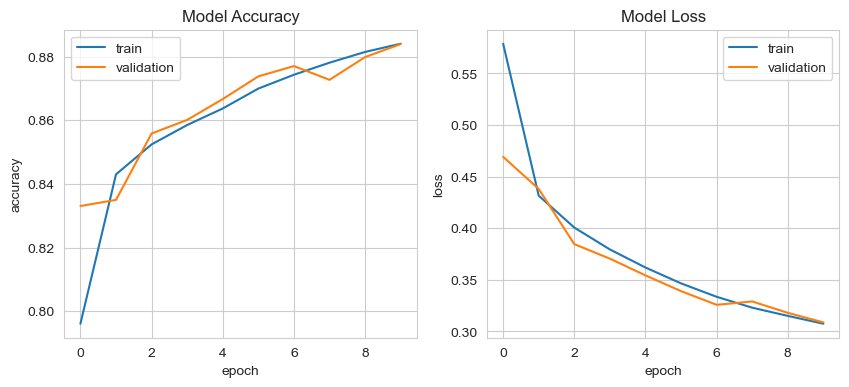

In [91]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))

    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
 
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')
    
plot_training_hist(history)

3553/3553 [==============================] - 60s 17ms/step


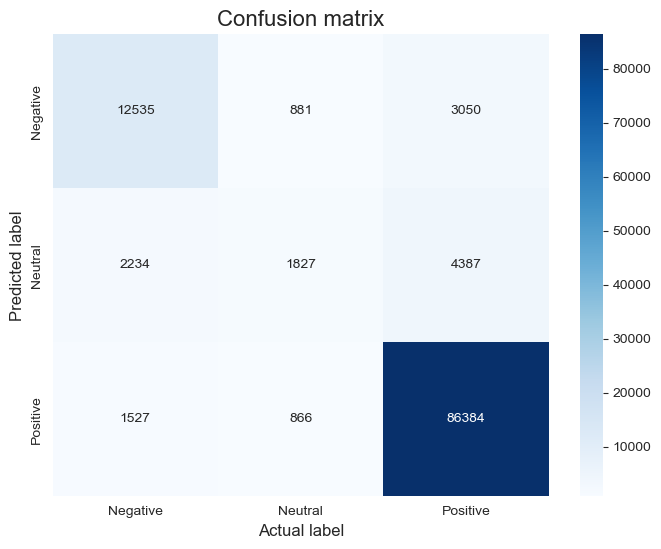

In [92]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, X_test, y_test):
    '''Function to plot confusion matrix for the passed model and the data'''
    
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    y_pred = model.predict(X_test)
    cm = confusion_matrix(np.argmax(np.array(y_test),axis=1), np.argmax(y_pred, axis=1))
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d', 
                xticklabels=sentiment_classes,
                yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Actual label', fontsize=12)
    plt.ylabel('Predicted label', fontsize=12)
    
plot_confusion_matrix(model, X_test, y_test)

In [93]:
model.save('FINAL_PROJECT_SENTIMENT_ANALYSIS.h5')
print(' model saved')

 model saved


Amazon Sentiment Analysis Pipeline

Step 1: Dataset Loading and Exploration Import Libraries: Begin by importing the necessary libraries such as pandas, TensorFlow, NLTK, and others. Load Dataset: Load the Amazon reviews dataset from the specified path. Data Exploration: Explore the dataset by checking its structure, summary statistics, and the distribution of sentiment scores.

Step 2: Data Preprocessing Drop Irrelevant Columns: Remove unnecessary columns like 'Id', 'ProductId', 'UserId', etc. Handle Missing Values: Check for missing values and decide whether to drop or impute them. Text Preprocessing: Lowercase the text, remove HTML tags, punctuation, and stopwords. Tokenize the text and perform stemming or lemmatization if required. Convert Sentiment Scores: Map sentiment scores to three classes: Negative, Neutral, and Positive based on score ranges.

Step 3: Visualization and Analysis Sentiment Distribution: Visualize the distribution of sentiment classes in the dataset using bar plots or pie charts. Text Length Analysis: Analyze the distribution of text lengths for positive and negative sentiment comments using histograms. Word Clouds: Generate word clouds to visualize the most common words in positive, negative, and neutral sentiment comments.

Step 4: Feature Engineering Encode Labels: Encode the sentiment classes into numerical values using LabelEncoder or one-hot encoding. Split Dataset: Split the dataset into training, validation, and testing sets. Vectorization: Vectorize the text data using techniques like CountVectorizer or TF-IDF.

Step 5: Model Building Define Model Architecture: Choose a suitable deep learning architecture such as LSTM or CNN for sentiment analysis. Tokenization and Padding: Tokenize the text data and pad sequences to ensure uniform length. Create Embedding Layer: Add an embedding layer to the model to handle word embeddings. Compile Model: Compile the model with appropriate loss function, optimizer, and evaluation metrics.

Step 6: Model Training Train Model: Train the model using the training data while validating it on the validation set. Monitor Performance: Monitor training progress by tracking metrics like accuracy, loss, precision, recall, and F1 score.

Step 7: Model Evaluation Evaluate on Test Set: Evaluate the trained model on the test set to assess its performance. Confusion Matrix: Visualize the confusion matrix to analyze the model's predictions across different sentiment classes. Save Model: Save the trained model for future use or deployment.

Step 8: Hyperparameter Tuning Optimize Hyperparameters: Fine-tune hyperparameters such as learning rate, batch size, and model architecture to improve performance. Cross-Validation: Use techniques like cross-validation to ensure robustness and generalization of the model.

Step 9: Model Deployment Deploy Model: Deploy the trained model in a production environment for real-time sentiment analysis tasks. Integration: Integrate the model into applications, websites, or APIs to make predictions on new data.

Step 10: Continuous Monitoring and Improvement Continuously monitor the model's performance in production to detect any drift or degradation.